# Introduction

Problem: Every bank experiences losses due to credit card defaults. I would like to present a data science solution: creaing a model to predict who will default. If we have a good idea of who will default, we can do something to try to prevent it (forebearance, consulting, etc.).

Objective: Predict whether or not a credit card client will default on their credit card
Audience: Lending Executives

# Target

Default payment (Yes=1, No=0)

# Features

limit_bal: Amount of the given credit (NT dollar): it includes both the individual consumer credit and his/her family (supplementary) credit

sex: Gender (1 = male; 2 = female)

X3: Education (1 = graduate school; 2 = university; 3 = high school; 4 = others)

X4: Marital status (1 = married; 2 = single; 3 = others)

X5: Age (year)

X6 - X11: History of past payment. (UCI) tracked the past monthly payment records (from April to September, 2005) as follows: The measurement scale for the repayment status is: -1 = pay duly; 1 = payment delay for one month; 2 = payment delay for two months; . . .; 8 = payment delay for eight months; 9 = payment delay for nine months and above

X12-X17: Amount of bill statement (NT dollar) from April to September, 2005

X18-X23: Amount of previous payment (NT dollar) from April to September 2005

# Import Libraries

In [182]:
# For data manipulation
import pandas as pd
import numpy as np
import psycopg2 as pg
import pickle

# Data visualization
import seaborn as sns
import matplotlib.pyplot as plt

# Modeling
from sklearn.inspection import permutation_importance
from sklearn import linear_model, svm, naive_bayes, neighbors, ensemble
from sklearn.model_selection import KFold, train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.metrics import classification_report, plot_confusion_matrix, confusion_matrix,\
roc_auc_score, roc_curve, precision_recall_curve, f1_score, fbeta_score, recall_score,\
precision_recall_fscore_support

from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import (RandomForestClassifier, ExtraTreesClassifier, VotingClassifier, 
                              AdaBoostClassifier, BaggingRegressor)
from sklearn.metrics import accuracy_score, make_scorer, log_loss

from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from collections import Counter
from mlxtend.plotting import plot_decision_regions

import xgboost as xgb

# Import from PostgreSQL

In [43]:
# Postgres info to connect
connection_args = {
    'host': 'localhost',
    'dbname': 'credit_default',
    'port': 5432
}

connection = pg.connect(**connection_args)

In [44]:
query = 'SELECT * FROM customers;'

df = pd.read_sql(query, connection)

# Data Preprocessing

In [45]:
# The column names are a little odd, so let's change them
history_names = {'pay_0':'Sep_Hist','pay_6':'Aug_Hist','pay_2':'Jul_Hist',
                 'pay_3':'Jun_Hist','pay_4':'May_Hist','pay_5':'Apr_Hist'}

balance_names = {'bill_amt1':'Sep_Bal','bill_amt2':'Aug_Bal','bill_amt3':'Jul_Bal',
                 'bill_amt4':'Jun_Bal','bill_amt5':'May_Bal','bill_amt6':'Apr_Bal'}

payment_names = {'pay_amt1':'Sep_Pmt','pay_amt2':'Aug_Pmt','pay_amt3':'Jul_Pmt',
                 'pay_amt4':'Jun_Pmt','pay_amt5':'May_Pmt','pay_amt6':'Apr_Pmt'}

df.rename(columns=history_names, inplace=True)
df.rename(columns=balance_names, inplace=True)
df.rename(columns=payment_names, inplace=True)
df.rename(columns={'default_payment_next_month':'Default'}, inplace=True)
df.head()

,id,limit_bal,sex,education,marriage,age,Sep_Hist,Jul_Hist,Jun_Hist,May_Hist,...,Jun_Bal,May_Bal,Apr_Bal,Sep_Pmt,Aug_Pmt,Jul_Pmt,Jun_Pmt,May_Pmt,Apr_Pmt,Default
0,1,20000,2,2,1,24,2,2,-1,-1,...,0,0,0,0,689,0,0,0,0,1
1,2,120000,2,2,2,26,-1,2,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,2,2,2,34,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,2,2,1,37,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,1,2,1,57,-1,0,-1,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0


In [46]:
# Sex, education, marriage, and age are useless columns. Legally, banks are not supposed
# include these characteristics as a factor for a making a loan. So these
# features have no predictive value. Also, ID column is just an identifier,
# which also has no predictive value. So we remove.
df.drop(['id', 'sex', 'education', 'marriage', 'age'], axis=1, inplace=True)

In [47]:
# Let's take a look at the range of values for payment history
payment_months = ['Sep_Hist', 'Aug_Hist', 'Jul_Hist',
                  'Jun_Hist', 'May_Hist', 'Apr_Hist']

for month in payment_months:
    print(sorted(df[month].unique()))

[-2, -1, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[-2, -1, 0, 2, 3, 4, 5, 6, 7, 8]
[-2, -1, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[-2, -1, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[-2, -1, 0, 1, 2, 3, 4, 5, 6, 7, 8]
[-2, -1, 0, 2, 3, 4, 5, 6, 7, 8]


In [48]:
# These ranges are pretty odd, let's change the range to 0-10, which is more reasonable
old_range = [-2, -1, 0, 1, 2, 3, 4, 5, 6, 7, 8]
new_range = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

for month in payment_months:
    df[month].replace(to_replace=old_range,
                      value=new_range,
                      inplace=True)

In [51]:
# Save dataframe to a csv for use in Tableau and serialize object as pickle
# for later use
df.to_csv('/Users/dominguez/Documents/Classification_Credit_Cards/data/df.csv')

with open('/Users/dominguez/Documents/Classification_Credit_Cards/web_app/df.pickle', 'wb') as         to_write:
    pickle.dump(df, to_write)

# Exploratory Analysis

In [54]:
df.head()

,limit_bal,Sep_Hist,Jul_Hist,Jun_Hist,May_Hist,Apr_Hist,Aug_Hist,Sep_Bal,Aug_Bal,Jul_Bal,Jun_Bal,May_Bal,Apr_Bal,Sep_Pmt,Aug_Pmt,Jul_Pmt,Jun_Pmt,May_Pmt,Apr_Pmt,Default
0,20000,4,4,1,1,0,0,3913,3102,689,0,0,0,0,689,0,0,0,0,1
1,120000,1,4,2,2,2,4,2682,1725,2682,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,90000,2,2,2,2,2,2,29239,14027,13559,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,50000,2,2,2,2,2,2,46990,48233,49291,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,50000,1,2,1,2,2,2,8617,5670,35835,20940,19146,19131,2000,36681,10000,9000,689,679,0


## Visualize Data

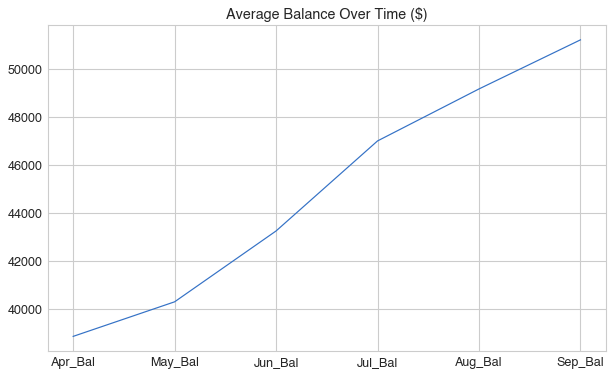

In [97]:
# Average balance over time
bal_months = ['Apr_Bal', 'May_Bal', 'Jun_Bal',
              'Jul_Bal', 'Aug_Bal', 'Sep_Bal']
avg_bal = []

for month in bal_months:
    avg_bal.append(df[month].mean())

plt.figure(figsize=(10,6))
plt.plot(bal_months, avg_bal)
plt.title('Average Balance Over Time ($)')
plt.show();

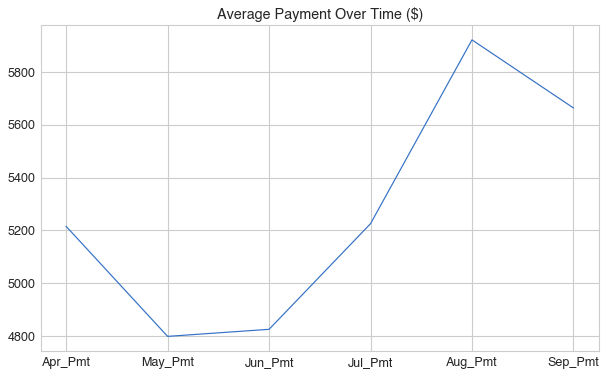

In [98]:
# Average payment over time
monthly_payments = ['Apr_Pmt', 'May_Pmt', 'Jun_Pmt',
                    'Jul_Pmt', 'Aug_Pmt', 'Sep_Pmt']
avg_pmt = []

for month in monthly_payments:
    avg_pmt.append(df[month].mean())

plt.figure(figsize=(10,6))
plt.plot(monthly_payments, avg_pmt)
plt.title('Average Payment Over Time ($)')
plt.show();

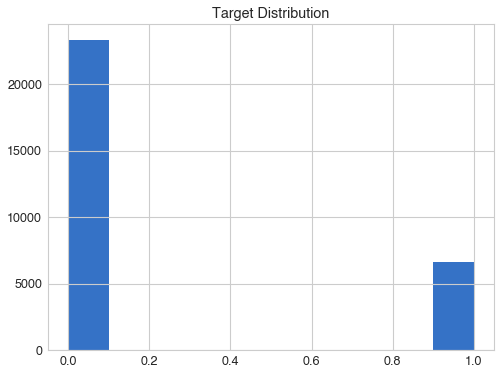

In [99]:
# The data is highly imbalanced
plt.figure(figsize=(10,6))
plt.hist(df.Default)
plt.title('Target Distribution')
plt.show();

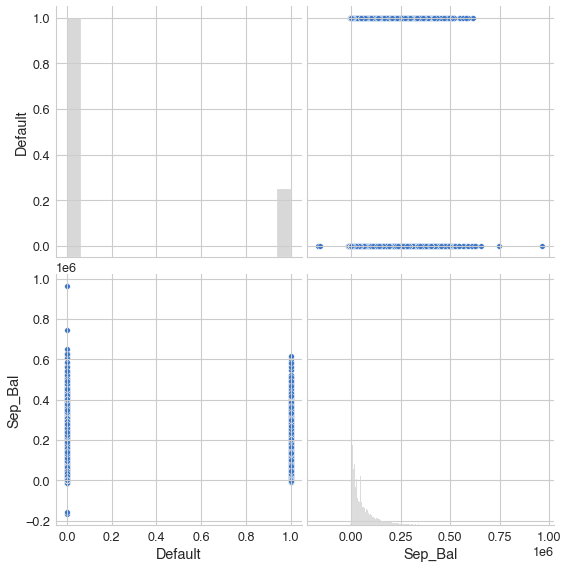

In [113]:
# Since monthly balance seems to increase leading to September,
# is there a correlation between default and September balance?
sns.pairplot(df[['Default', 'Sep_Bal']],height=4);

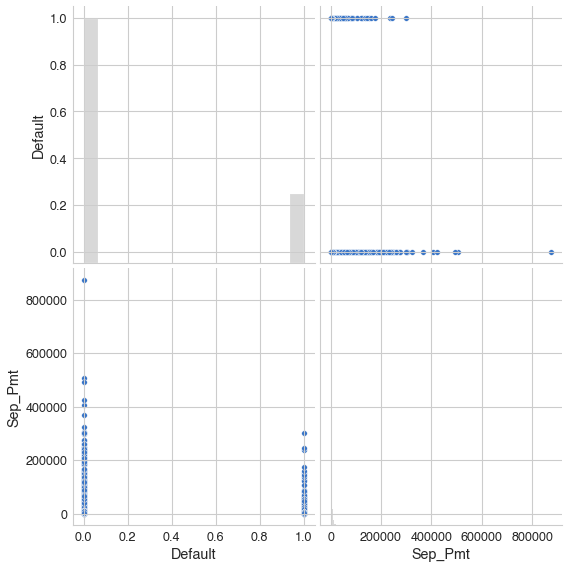

In [114]:
# Between default and september payment?
sns.pairplot(df[['Default', 'Sep_Pmt']],height=4);

No noticeable correlations between default and september payment/balance

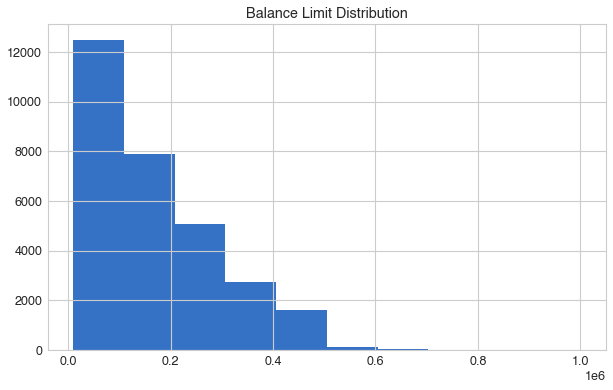

In [116]:
# Distribution of limit balance
plt.figure(figsize=(10,6))
plt.hist(df['limit_bal'])
plt.title('Balance Limit Distribution')
plt.show();

Most of the balances are 0-300k

# Minimal Viable Product

Let's test several models to get a base model to proceed with further testing

## Features and target variables

In [183]:
X = df.loc[:,'limit_bal':'Apr_Pmt']
y = df['Default']

## Split the Data

In [184]:
def train_test_val_split(X, y):
    """
    Input: X --> array of features, y --> target array
           set aside for testing.
    Output: Features and target split into train, val and test sets. 
            Test size = 20%
            Val size = 25%
            Converted to numpy arrays.
    """
    X, X_test, y, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Split train/validate sets
    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.25, random_state=42)

    # Convert to numpy arrays to help with generate indeces below
    X, y = np.array(X), np.array(y)

    return X_train, X_val, X_test, y_train, y_val, y_test

In [185]:
X_train, X_val, X_test, y_train, y_val, y_test = train_test_val_split(X, y)

In [186]:
def scale_data(X_train, X_val, X_test):
    """
    Input: Features (numpy arrays)
    Output: Scaled data
    """
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_val)
    X_test_scaled = scaler.transform(X_test)

    return X_train_scaled, X_val_scaled, X_test_scaled

In [187]:
X_train_scaled, X_val_scaled, X_test_scaled = scale_data(X_train, X_val, X_test)

In [188]:
def model_scores(X_train_scaled, X_val_scaled, X_test_scaled, y_train, y_val, y_test, test=False):
    """
    Input: Transformed feature and target sets
    Output: Validation scores. If test=True, includes test scores
    """
    print('Calculating validation scores...\n')
    # Knn
    knn = KNeighborsClassifier(n_neighbors=5)
    knn.fit(X_train_scaled,y_train)
    print(f'KNN score: {knn.score(X_val_scaled,y_val)}')

    # Logistic Regression
    lr = LogisticRegression(penalty='none')
    lr.fit(X_train_scaled,y_train)
    print(f'Logistic Regression score: {lr.score(X_val_scaled,y_val)}')

    # Random Forest
    rf = RandomForestClassifier()
    rf.fit(X_train_scaled,y_train)
    print(f'Random Forest score: {rf.score(X_val_scaled,y_val)}')

    # XGBoost
    xgb = XGBClassifier()
    xgb.fit(X_train_scaled,y_train)
    print(f'XGBoost score: {gbm.score(X_val_scaled,y_val)}')

    # SVC
    svc = SVC(probability=True)
    svc.fit(X_train_scaled,y_train)
    print(f'SVC score: {svc.score(X_val_scaled,y_val)}')

    if test:
        print("\nCalculating test scores...\n")
        # Knn
        print(f'KNN test score: {knn.score(X_test_scaled,y_test)}')

        # Logistic Regression
        print(f'Logistic Regression test score: {lr.score(X_test_scaled,y_test)}')

        # Random Forest
        print(f'Random Forest test score: {rf.score(X_test_scaled,y_test)}')

        # XGBoost
        print(f'XGBoost test score: {xgb.score(X_test_scaled,y_test)}')

        # SVC
        print(f'SVC test score: {svc.score(X_test_scaled,y_test)}')

    return knn, lr, rf, xgb, svc

In [189]:
knn, lr, rf, xgb, svc = score(X_train_scaled, X_val_scaled, X_test_scaled,
                              y_train, y_val, y_test, test=False)

Calculating validation scores...

KNN score: 0.7968333333333333
Logistic Regression score: 0.8126666666666666
Random Forest score: 0.815
XGBoost score: 0.8141666666666667
SVC score: 0.82


SVC performs the best with an accuracy of 0.82

# Performance Metrics

# HERE WE IS!!!

# Feature Importance
There are many feature importance scores one could perform to determine
which features are most useful. For this case, we will use Permutation Importance.

Permutation Importance is the decrease in a model score when a single feature is randomly shuffled. The higher the drop in score, the less important the feature is

Feature: 0, Score: 0.00143
Feature: 1, Score: 0.06390
Feature: 2, Score: 0.00505
Feature: 3, Score: 0.00307
Feature: 4, Score: 0.00150
Feature: 5, Score: 0.00272
Feature: 6, Score: 0.00308
Feature: 7, Score: 0.00078
Feature: 8, Score: 0.00110
Feature: 9, Score: 0.00120
Feature: 10, Score: 0.00260
Feature: 11, Score: 0.00140
Feature: 12, Score: 0.00103
Feature: 13, Score: 0.00032
Feature: 14, Score: 0.00085
Feature: 15, Score: 0.00042
Feature: 16, Score: 0.00020
Feature: 17, Score: 0.00010
Feature: 18, Score: -0.00007


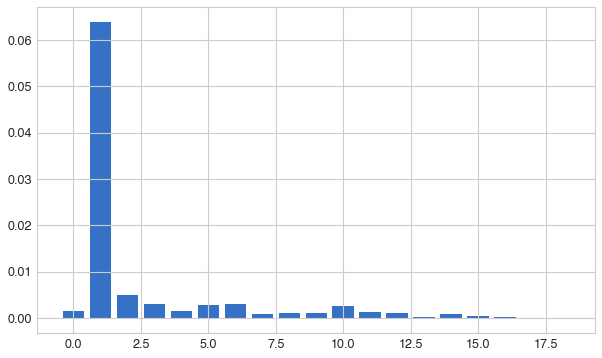

In [200]:
results = permutation_importance(svc, X_test_scaled, y_test, scoring='accuracy', n_repeats=10,
                                 random_state=42, n_jobs=2)
# get importance
importance = results.importances_mean

# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))

# plot feature importance
plt.figure(figsize=(10,6))
plt.bar([x for x in range(len(importance))], importance)
plt.show()

The second feature 'Sep_Hist' seems to have the higher permutaiton importance score.

This makes sense because a customer with a poor payment history as of September is likely to default in October.